In [58]:
from typing import Any
from dataclasses import dataclass
import mfsr_utils
from numbers import Integral
from pathlib import Path
import torch
import numpy as np
from numpy import typing as npt
from torch import Tensor
from temp import RawImage, ImageSizes
import torchvision
from torchvision.transforms.functional import to_pil_image
import rawpy

SAMPLES_DIR = "arw-samples"


def show_tensor(image: Tensor) -> None:
    assert image.is_floating_point()

    # Gross hack to make images contrasty and visible
    image = image.div(image.max()).mul(255).to(torch.uint8)

    display(to_pil_image(image))  # type: ignore


In [59]:
raw_img = RawImage.from_file(f"{SAMPLES_DIR}/DSC07310.ARW")
image = raw_img.to_tensor()
image.min(), image.max(), image.dtype, image.shape


(tensor(0.0079), tensor(0.1805), torch.float32, torch.Size([3276, 4920]))

In [60]:

assert raw_img.color_desc == "RGBG"

red = image[0::2, 0::2]
green_red = image[0::2, 1::2]
blue = image[1::2, 0::2]
green_blue = image[1::2, 1::2]
mosaiced = torch.stack((red, green_red, blue, green_blue), dim=0)
mosaiced.shape

torch.Size([4, 1638, 2460])

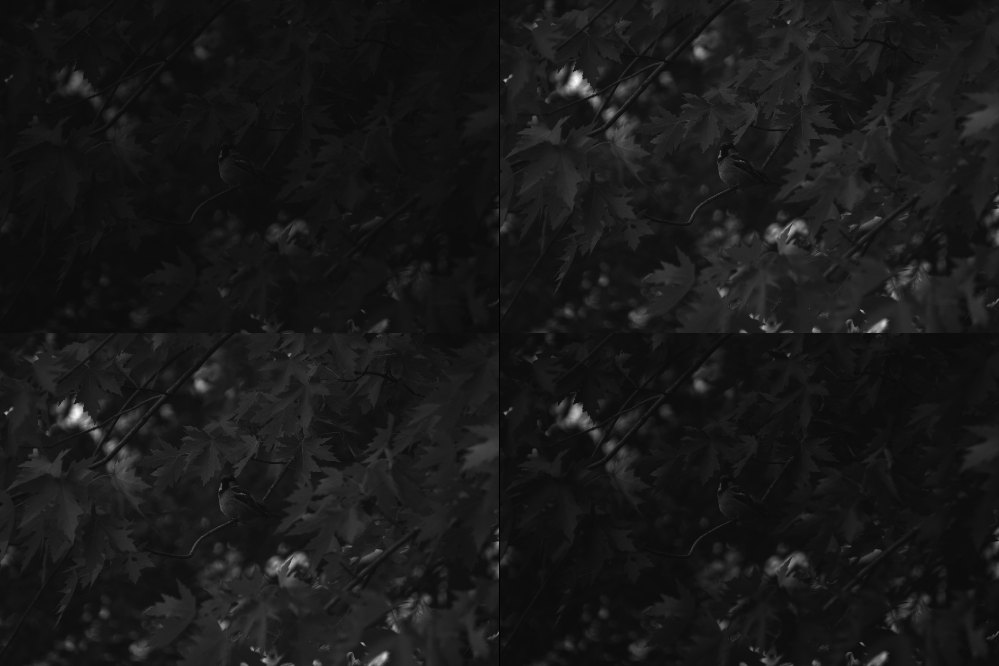

In [65]:
channel_grid = torchvision.utils.make_grid(mosaiced.unsqueeze(1), nrow=2)
show_tensor(channel_grid)

In [62]:
h_patch_size = 128
w_patch_size = 128
patches = (
    mosaiced
    .unfold(1, h_patch_size, h_patch_size)
    .unfold(2, w_patch_size, w_patch_size)
)
C, num_h_patches, num_w_patches, _, _ = patches.shape
patches.shape

torch.Size([4, 12, 19, 128, 128])

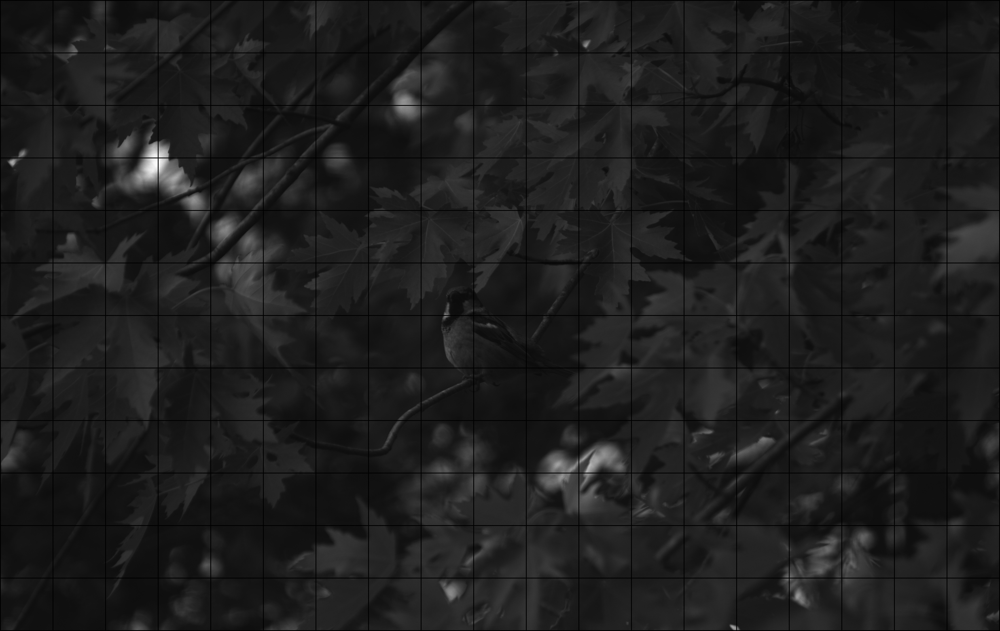

In [72]:
patches_blue_grid = torchvision.utils.make_grid(
    patches[2].reshape(-1, h_patch_size, w_patch_size).unsqueeze(1),
    nrow=num_w_patches
)
show_tensor(patches_blue_grid)